# Trying a Neural Network to predict the rest-eigen part from the eigenvalues and the eigen-eigen part

In [1]:
using LmaPredict, Flux, Statistics, ProgressMeter

## Reading the data

In [2]:
const path_config = "/Users/lukasgeyer/Studium/Computational Sciences/Masterarbeit/Daten Simon/dat"
const path_plot = "../plots"

"../plots"

In [3]:
fname = readdir(path_config)[2:5001]
idx = sortperm( parse.(Int64, fname))
fname = fname[idx]
em = "PA"

cnfgarr = Vector{LMAConfig}(undef, 0)
for f in fname
    push!(cnfgarr, get_LMAConfig(joinpath(path_config, f), "g5-g5", em="PA", bc=false))
end

## Splitting data in training and test sets

In [5]:
# Select a specific Tsource and divide data into training and test set for eigenvalues, rr re and ee components
TSRC="12"
NCNFG = length(cnfgarr)
TVALS = length(cnfgarr[1].data["rr"][TSRC]) - 1
if em == "PA"
    EIGVALS = 32
else 
    EIGVALS = 64
end

eigvals_data = Array{Float32}(undef, EIGVALS, 500)
rr_data = Array{Float32}(undef, TVALS, 500)
ee_data = Array{Float32}(undef, TVALS, 500)
re_data = Array{Float32}(undef, TVALS, 500)

eigvals_data_test = Array{Float32}(undef, EIGVALS, 4500)
rr_data_test = Array{Float32}(undef, TVALS, 4500)
ee_data_test = Array{Float32}(undef, TVALS, 4500)
re_data_test = Array{Float32}(undef, TVALS, 4500)

for (k, dd) in enumerate(getfield.(cnfgarr, :data)[1:500])
    eigvals_data[:,k] = copy(cnfgarr[k].data["eigvals"][1:EIGVALS])
    rr_data[:,k] = getindex(getindex(dd, "rr"), TSRC)[2:end]
    ee_data[:,k] = getindex(getindex(dd, "ee"), TSRC)[2:end]
    re_data[:,k] = getindex(getindex(dd, "re"), TSRC)[2:end]
end
for (k, dd) in enumerate(getfield.(cnfgarr, :data)[501:5000])
    eigvals_data_test[:,k] = copy(cnfgarr[k].data["eigvals"][1:EIGVALS])
    rr_data_test[:,k] = getindex(getindex(dd, "rr"), TSRC)[2:end]
    ee_data_test[:,k] = getindex(getindex(dd, "ee"), TSRC)[2:end]
    re_data_test[:,k] = getindex(getindex(dd, "re"), TSRC)[2:end]
end

## Describing the Neural Network

We construct a Neural Network that has two inputs: the $n_{\lambda}$ inversed eigenvalues $\{\lambda_i\}$ and the $n_{ee}$ eigen-eigen-contributions $\{ee_i\}$. Each input is handled seperately by two dense layers of size **hidden_length** followed by one fully connected layer of the same size as the input (so $n_{\lambda}$ or $n_{ee}$). These two vectors then get combined via vcat and then fed into three dense layers of again size **hidden_length**, followed by an output layer which has the same size as the rest-eigen contributions (so 47).

$ v_{i,1} = \begin{bmatrix} \ \frac{1}{\lambda_1} \ \\[6pt] \ \frac{1}{\lambda_2} \ \\[6pt] \ \frac{1}{\lambda_3} \ \\[6pt] \vdots \\[6pt] \frac{1}{\lambda_{n_{\lambda}}} \end{bmatrix} , \ \ \ 
 v_{i,2} = \begin{bmatrix} \ ee_1 \ \\[6pt] \ ee_2 \ \\[6pt]\ ee_3 \ \\[6pt] \vdots \\[6pt]\ ee_{n_{ee}} \ \end{bmatrix}
$

In [9]:
input_length = TVALS + EIGVALS
output_length = TVALS
hidden_length = 2*input_length

eigvals_input_data = Float32.((1 ./ eigvals_data .- mean([sum(1 ./ eigvals_data[:,i]) / EIGVALS for i in 1:500])) ./ 30.00)
ee_input_data = ee_data .- mean([sum((ee_data[:,i])) / TVALS for i in 1:500])

input_data = (eigvals_input_data, ee_input_data)
target = re_data 

test_eigvals_input_data = Float32.((1 ./ eigvals_data_test .- mean([sum(1 ./ eigvals_data[:,i]) / EIGVALS  for i in 1:500])) ./ 30.00)
test_ee_input_data = ee_data_test .- mean([sum(ee_data[:,i]) / TVALS for i in 1:500])

test_input_data = (test_eigvals_input_data, test_ee_input_data)
test_target = re_data_test;

## Rescaling both input vectors to have mean 0

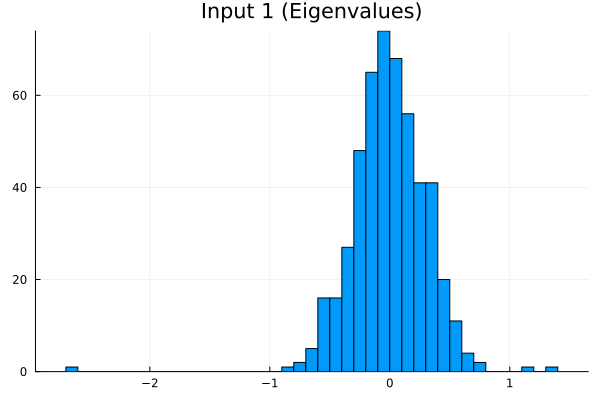

In [10]:
using Plots

histogram([sum(eigvals_input_data[:,i]) / EIGVALS for i in 1:500], title="Input 1 (Eigenvalues)", legend=:false)

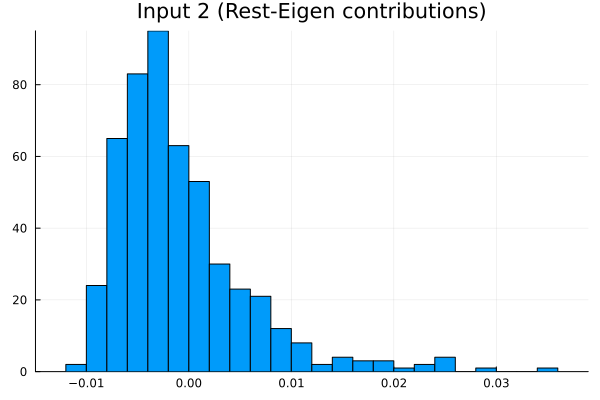

In [11]:
histogram([sum(test_ee_input_data[:,i]) / TVALS for i in 1:500], title="Input 2 (Rest-Eigen contributions)", legend=:false)

## Defining the Network

In [13]:
using Flux

struct Join{T, F}
  combine::F
  paths::T
end

Join(combine, paths...) = Join(combine, paths)

Join

In [14]:
(m::Join)(xs::Tuple) = m.combine(map((f, x) -> f(x), m.paths, xs)...)
(m::Join)(xs...) = m(xs)

In [38]:
model_eigvals = Chain(
    Dense(EIGVALS => hidden_length, tanh),
    Dense(hidden_length => hidden_length, tanh),
    Dense(hidden_length => EIGVALS, tanh)
    )

model_tvals = Chain(
    Dense(TVALS => hidden_length, tanh),
    Dense(hidden_length => hidden_length, tanh),
    Dense(hidden_length => TVALS, tanh)
    )

model_combined = Chain(
    Join(vcat,
        model_eigvals,
        model_tvals
        ),
    Dense(EIGVALS + TVALS => hidden_length, tanh),
    Dense(hidden_length => hidden_length, tanh),
    Dense(hidden_length => hidden_length, tanh),
    Dense(hidden_length => output_length, NNlib.tanhshrink),
)

Chain(
  Join{Tuple{Chain{Tuple{Dense{typeof(tanh), Matrix{Float32}, Vector{Float32}}, Dense{typeof(tanh), Matrix{Float32}, Vector{Float32}}, Dense{typeof(tanh), Matrix{Float32}, Vector{Float32}}}}, Chain{Tuple{Dense{typeof(tanh), Matrix{Float32}, Vector{Float32}}, Dense{typeof(tanh), Matrix{Float32}, Vector{Float32}}, Dense{typeof(tanh), Matrix{Float32}, Vector{Float32}}}}}, typeof(vcat)}(vcat, (Chain(Dense(32 => 158, tanh), Dense(158 => 158, tanh), Dense(158 => 32, tanh)), Chain(Dense(47 => 158, tanh), Dense(158 => 158, tanh), Dense(158 => 47, tanh)))),
  Dense(79 => 158, tanh),               # 12_640 parameters
  Dense(158 => 158, tanh),              # 25_122 parameters
  Dense(158 => 158, tanh),              # 25_122 parameters
  Dense(158 => 47, tanhshrink),         # 7_473 parameters
)                   # Total: 8 arrays, 70_357 parameters, 571.781 KiB.

## Defining training input and target data

In [39]:
loader = Flux.DataLoader((input_data, target), batchsize=32, shuffle=true)

optim = Flux.setup(Flux.Adam(0.001), model_combined);

## Training the Network

The network sees the whole data set **epochs** times. As loss function we use Mean Squared Error.

In [40]:
epochs = 10_000

losses = []
@showprogress for epoch in 1:epochs
    for (x, y) in loader
        loss, grads = Flux.withgradient(model_combined) do m
            y_hat = m(x)
            Flux.mse(y_hat, y)
        end
        Flux.update!(optim, model_combined, grads[1])
        push!(losses, loss) 
    end
end

Progress: 100%|█████████████████████████████████████████| Time: 0:01:52


## Checking loss dynamics during training

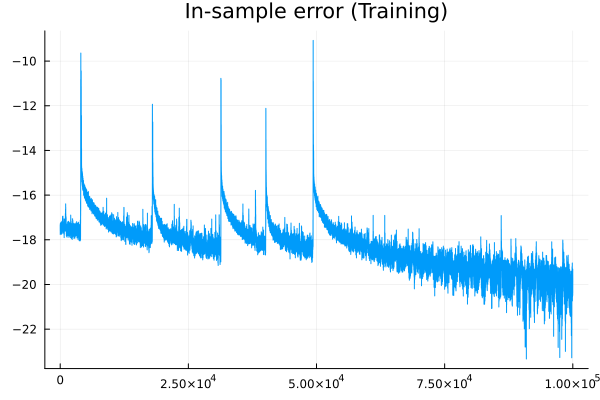

In [41]:
using Plots

plot(log.(losses[end-100000:end] .- minimum(losses)), title="In-sample error (Training)", legend=:false)

## Checking out-of-sample results

In [42]:
out_of_sample_predictions = model_combined(test_input_data);

maximum error: 0.0011804304
minimum error: 3.9395648e-8
average error: 1.1759678e-6


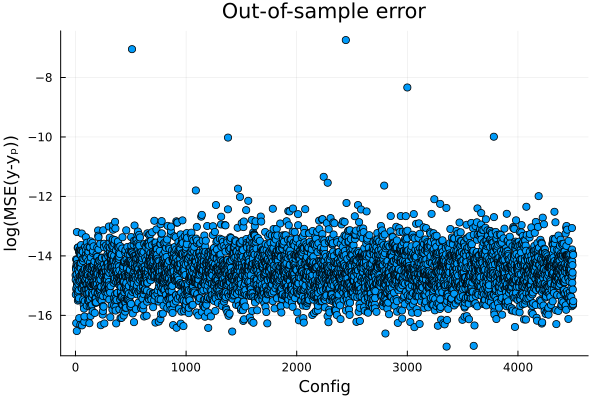

In [47]:
out_of_sample_error = [Flux.mse(out_of_sample_predictions[:,i], test_target[:,i]) for i in 1:4500]

println("maximum error: ", maximum(out_of_sample_error))
println("minimum error: ", minimum(out_of_sample_error))
println("average error: ", mean(out_of_sample_error))

scatter(log.(out_of_sample_error), title="Out-of-sample error", legend=:false)

xlabel!("Config")
ylabel!("log(MSE(y-yₚ))")

Current best perfomance:

maximum error: 0.0011804304

minimum error: 3.9395648e-8

average error: 1.1759678e-6

with this model:

model_eigvals = Chain(
    Dense(EIGVALS => hidden_length, tanh),
    Dense(hidden_length => hidden_length, tanh),
    Dense(hidden_length => EIGVALS, tanh)
    )

model_tvals = Chain(
    Dense(TVALS => hidden_length, tanh),
    Dense(hidden_length => hidden_length, tanh),
    Dense(hidden_length => TVALS, tanh)
    )

model_combined = Chain(
    Join(vcat,
        model_eigvals,
        model_tvals
        ),
    Dense(EIGVALS + TVALS => hidden_length, tanh),
    Dense(hidden_length => hidden_length, tanh),
    Dense(hidden_length => hidden_length, tanh),
    Dense(hidden_length => output_length, NNlib.tanhshrink),
)

In [48]:
using Plots

l = @layout [a b c; d e f; g h i]

c1 = rand([i for i in 1:500])
p1 = scatter(test_target[:,c1], label="Actual")
scatter!(p1, out_of_sample_predictions[:,c1], label="Prediction", legend=:top)

c2 = rand([i for i in 1:500])
p2 = scatter(test_target[:,c2], label="Actual")
scatter!(p2, out_of_sample_predictions[:,c2], label="Prediction", legend=:top)

c3 = rand([i for i in 1:500])
p3 = scatter(test_target[:,c3], label="Actual")
scatter!(p3, out_of_sample_predictions[:,c3], label="Prediction", legend=:top, )

c4 = rand([i for i in 1:500])
p4 = scatter(test_target[:,c4], label="Actual")
scatter!(p4, out_of_sample_predictions[:,c4], label="Prediction", legend=:top)

c5 = rand([i for i in 1:500])
p5 = scatter(test_target[:,c5], label="Actual")
scatter!(p5, out_of_sample_predictions[:,c5], label="Prediction", legend=:top)

c6 = rand([i for i in 1:500])
p6 = scatter(test_target[:,c6], label="Actual")
scatter!(p6, out_of_sample_predictions[:,c6], label="Prediction", legend=:top)

c7 = rand([i for i in 1:500])
p7 = scatter(test_target[:,c7], label="Actual")
scatter!(p7, out_of_sample_predictions[:,c7], label="Prediction", legend=:top)

c8 = rand([i for i in 1:500])
p8 = scatter(test_target[:,c8], label="Actual")
scatter!(p8, out_of_sample_predictions[:,c8], label="Prediction", legend=:top)

c9 = rand([i for i in 1:500])
p9 = scatter(test_target[:,c9], label="Actual")
scatter!(p9, out_of_sample_predictions[:,c9], label="Prediction", legend=:top)

plot(p1, p2, p3, p4, p5, p6, p7, p8, p9, layout = l, size=(1200,1000), dpi=1000, markerstrokewidth = 0)
#savefig(joinpath(path_plot, "neural_network_test.pdf"))

## Bias correction

### Calculating statistical errors

In [115]:
re_mean = [sum(test_target[i,:]) / 4500 for i in 1:47]
re_predicted_mean = [sum(out_of_sample_predictions[i,:]) / 4500 for i in 1:47]

re_err = [sqrt(sum( (test_target[i,:] .- re_mean[i]).^2 / 4499 )) for i in 1:47] ./ sqrt(4500)
re_predicted_err = [sqrt(sum( (out_of_sample_predictions[i,:] .- re_mean[i]).^2 / 4499 )) for i in 1:47] ./ sqrt(4500);

### Applying bias correction on a percentage of the test data

In [129]:
percentage = 0.04

n_configs = Int(4500 * percentage)

configs = rand([i for i in 1:4500], n_configs)

bias_correction = sum([re_predicted_mean - test_target[:,i] for i in configs][i] for i in 1:n_configs) ./ n_configs

re_predicted_mean_corrected = re_predicted_mean - bias_correction;

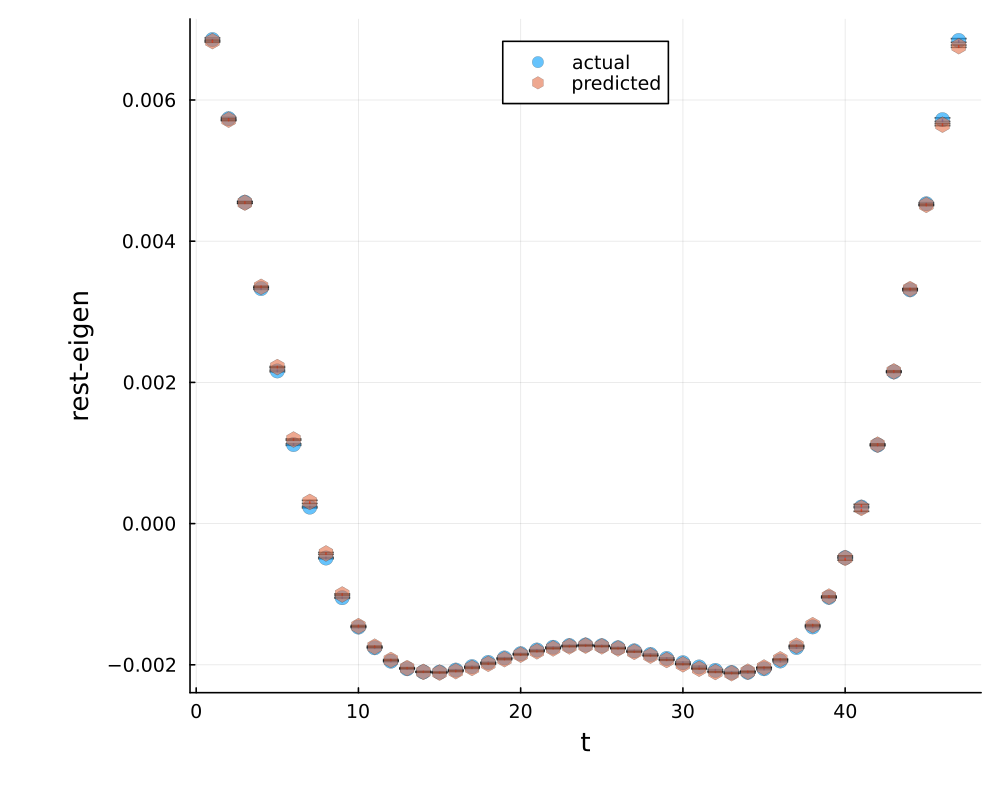

In [130]:
using Plots

p = plot(size=(1000,800),thickness_scaling = 1.6)
scatter!(p,re_mean,
    yerr=re_err,
    label="actual",
    legend=:top,
    line=(:dot, 1),
    linecolor=:blue,
    markerstrokewidth = 0.1,
    markersize = 5,
    markeralpha = 0.6
)
scatter!(p,re_predicted_mean_corrected,
    yerr=re_predicted_err,
    label="predicted",
    marker = ([:hex :d]),
    line = (:dot, 1),
    linecolor=:red,
    markerstrokewidth = 0.1,
    markersize = 5,
    markeralpha = 0.6
)
xlabel!(p,"t")
ylabel!(p,"rest-eigen")